In [1]:
from time import time

In [2]:
tic = time()

In [3]:
from ship_routing import Trajectory
from ship_routing.currents import load_currents_time_average
from ship_routing.mc import move_random_node

In [4]:
import numpy as np
import tqdm
import pandas as pd
import shapely
import warnings
from random import choice
from functools import reduce, partial

In [5]:
from dask.distributed import Client

In [6]:
client = Client(n_workers=12, threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 12
Total threads: 12,Total memory: 36.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:56345,Workers: 12
Dashboard: http://127.0.0.1:8787/status,Total threads: 12
Started: Just now,Total memory: 36.00 GiB
Comm: tcp://127.0.0.1:56375,Total threads: 1
Dashboard: http://127.0.0.1:56389/status,Memory: 3.00 GiB
Nanny: tcp://127.0.0.1:56348,


2024-04-22 14:50:36,066 - distributed.scheduler - ERROR - Removing worker 'tcp://127.0.0.1:56380' caused the cluster to lose scattered data, which can't be recovered: {'Dataset-64503e0e09791a085a9ef66bf0c547b6'} (stimulus_id='handle-worker-cleanup-1713790236.0667799')
2024-04-22 14:50:36,069 - distributed.nanny - WARNING - Restarting worker
2024-04-22 14:50:36,183 - distributed.nanny - WARNING - Restarting worker
2024-04-22 14:50:36,503 - distributed.nanny - WARNING - Restarting worker
2024-04-22 14:50:37,526 - distributed.nanny - WARNING - Restarting worker


In [7]:
from dask import bag as dbag

In [8]:
from matplotlib import pyplot as plt
import cartopy

In [9]:
# parameters
resolution = 2_000_000
perturbation = 500_000
perturbation_numsteps = 1
duration = 15 * 24 * 3600
random_seed = 1234
population_size = 40
num_evol_steps = 2
npartitions = 100

In [10]:
np.random.seed(random_seed)

In [11]:
currents = load_currents_time_average(
    "data/currents/cmems_mod_glo_phy-cur_anfc_0.083deg_P1D-m_2021-01_100W-020E_10N-65N.nc",
)
currents["speed"] = (currents.to_array() ** 2).sum("variable") ** 0.5
currents = currents.where(currents.speed > 0)
# currents["uo"] = - currents["uo"]
# currents["uo"], currents["vo"] = currents["vo"], currents["uo"]
# currents = currents.coarsen(lon=3, lat=3, boundary="trim").mean()
currents = currents.compute()
currents

<xarray.Dataset> Size: 10MB
Dimensions:  (lat: 661, lon: 1321)
Coordinates:
    depth    float32 4B 0.494
  * lat      (lat) float32 3kB 10.0 10.08 10.17 10.25 ... 64.75 64.83 64.92 65.0
  * lon      (lon) float32 5kB -100.0 -99.92 -99.83 -99.75 ... 9.833 9.917 10.0
Data variables:
    uo       (lat, lon) float32 3MB -0.1356 -0.1479 -0.1598 ... 0.07963 0.05846
    vo       (lat, lon) float32 3MB -0.01258 -0.02277 -0.0322 ... 0.2739 0.4073
    speed    (lat, lon) float32 3MB 0.1362 0.1497 0.163 ... 0.0112 0.2852 0.4115

In [12]:
# currents = currents.chunk({}).persist()
# currents

In [13]:
_curr = client.scatter(currents)

In [14]:
traj_ref = Trajectory(
    lon=[-77.5, -9.5],
    lat=[34.1, 38.5],
    duration_seconds=duration,
).refine(new_dist=resolution)

In [15]:
traj_ref.speed_ms

4.6192796317614535

In [16]:
def calc_cost(traj, curr):
    return traj.estimate_cost_through(curr.result())  # .compute()

In [17]:
def mutation(
    traj,
    curr=None,
    perturbation_numsteps=perturbation_numsteps,
    perturbation=perturbation,
):
    traj = traj.copy()
    for npert in range(perturbation_numsteps):
        _traj = (
            move_random_node(
                trajectory=traj,
                max_dist_meters=perturbation,
            )
            .homogenize()
            .refine(new_dist=resolution)
            .homogenize()
        )
        _cost = _traj.estimate_cost_through(curr.result())
        if not np.isnan(_cost):
            traj = _traj.copy()
    return traj

In [18]:
def selection(population, keep_percent=20, currents=currents):
    cost = population.map(partial(calc_cost, curr=currents))
    cost_series = pd.Series(cost.compute())
    cutoff = cost_series.quantile(keep_percent / 100)
    selected = population.filter(lambda m: calc_cost(m, curr=currents) <= cutoff)
    return selected

In [19]:
def reproduction(population, population_size=population_size):
    return dbag.from_sequence(
        [choice(population) for n in range(population_size)], npartitions=npartitions
    )

In [20]:
%%time

population = dbag.from_sequence(
    [traj_ref.copy() for npop in range(population_size)], npartitions=npartitions
)
# warmup
population = population.map(
    partial(mutation, curr=_curr, perturbation=perturbation, perturbation_numsteps=3)
);

CPU times: user 1.14 ms, sys: 241 µs, total: 1.38 ms
Wall time: 1.39 ms


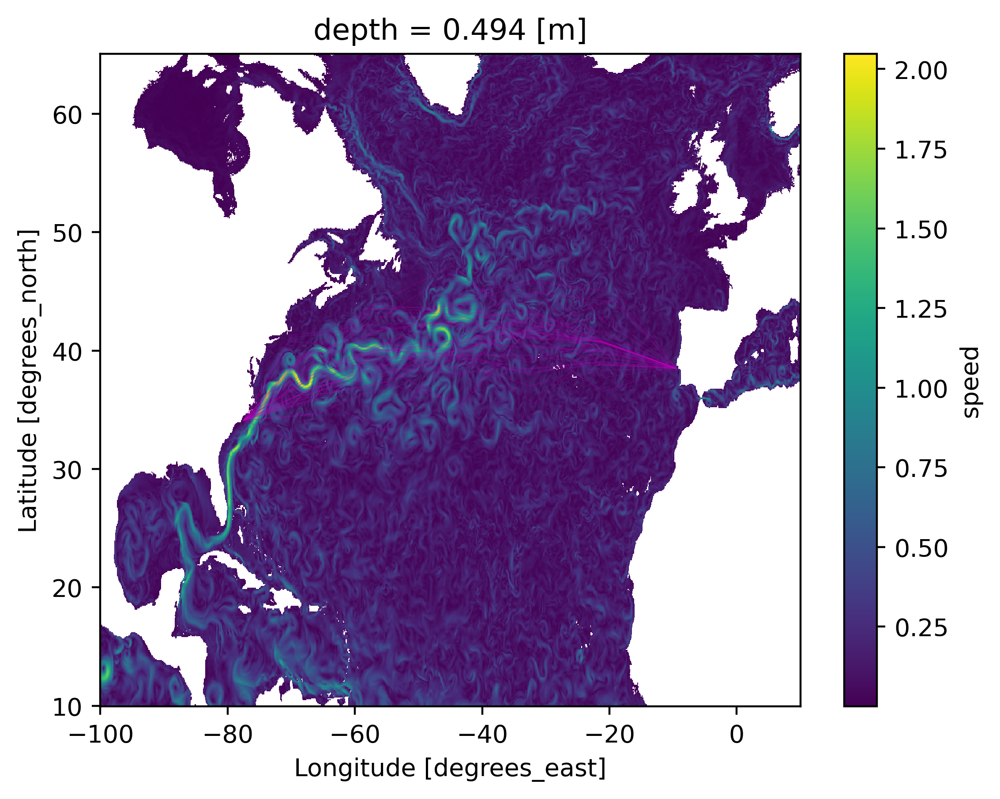

In [21]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [22]:
for nevol in tqdm.tqdm(range(num_evol_steps)):
    mutated = population.map(
        partial(
            mutation, curr=_curr, perturbation=perturbation, perturbation_numsteps=1
        )
    )
    selected = selection(
        dbag.concat([mutated, population]), currents=_curr, keep_percent=50
    ).compute()
    population = reproduction(selected)

population = population.compute();

100%|███████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.37s/it]


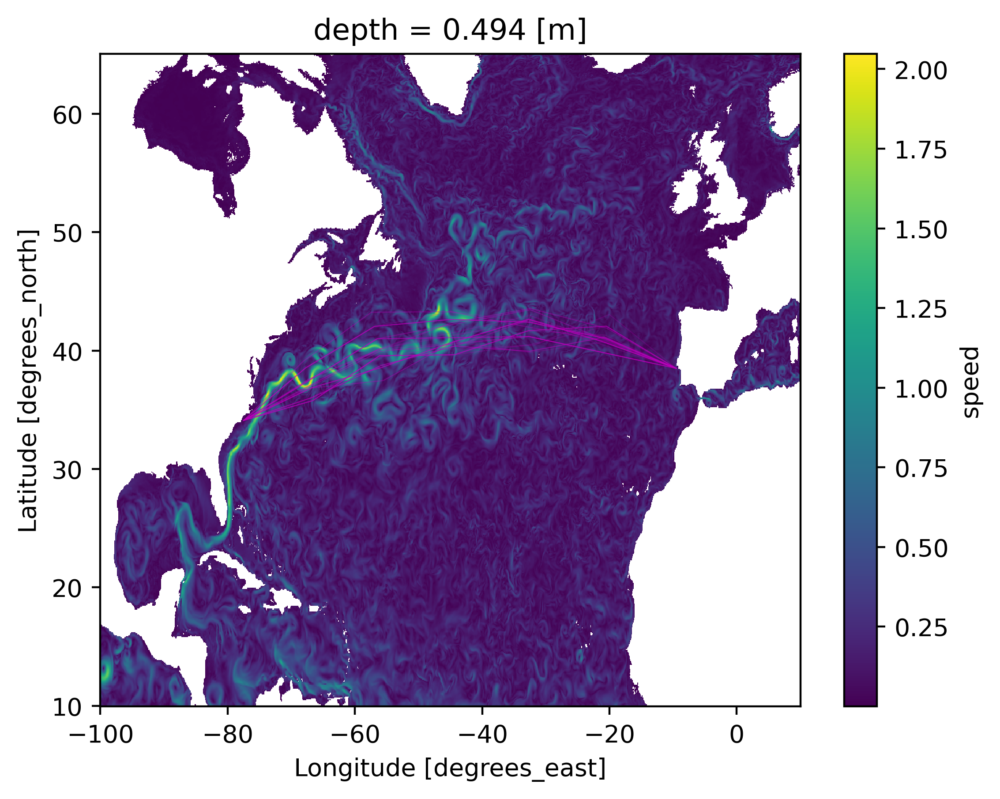

In [23]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [24]:
resolution /= 2
perturbation /= 2
population_size *= 2

In [25]:
population = dbag.from_sequence(
    [
        choice(population).refine(new_dist=resolution).homogenize().copy()
        for n in range(population_size)
    ]
)

In [26]:
for nevol in tqdm.tqdm(range(num_evol_steps)):
    mutated = population.map(
        partial(
            mutation, curr=_curr, perturbation=perturbation, perturbation_numsteps=1
        )
    )
    selected = selection(
        dbag.concat([mutated, population]), currents=_curr, keep_percent=50
    ).compute()
    population = reproduction(selected)

population = population.compute();

100%|███████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.03s/it]


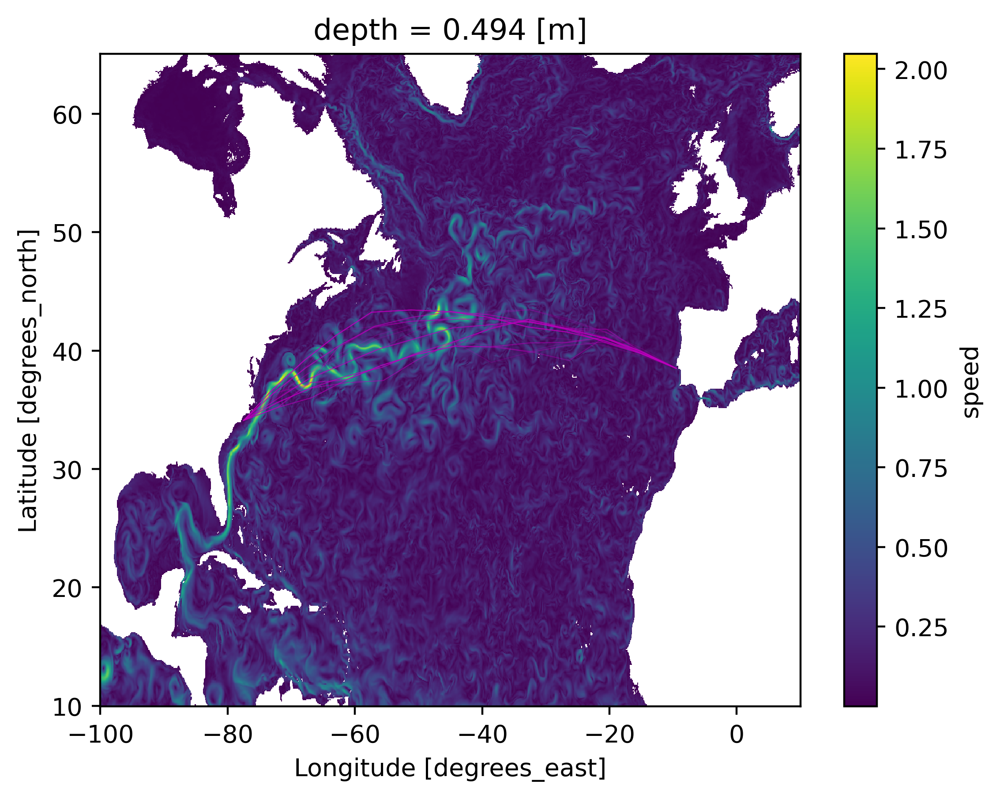

In [27]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [28]:
resolution /= 2
perturbation /= 2
population_size *= 2

In [29]:
population = dbag.from_sequence(
    [
        choice(population).refine(new_dist=resolution).homogenize().copy()
        for n in range(population_size)
    ]
)
# warmup
population = population.map(
    partial(
        mutation, curr=_curr, perturbation=perturbation * 4, perturbation_numsteps=3
    )
);

In [30]:
for nevol in tqdm.tqdm(range(4 * num_evol_steps)):
    mutated = population.map(partial(mutation, curr=_curr, perturbation_numsteps=1))
    selected = selection(
        dbag.concat([mutated, population]), currents=_curr, keep_percent=50
    ).compute()
    population = reproduction(selected)

population = population.compute();

100%|███████████████████████████████████████████████████████████████████| 8/8 [00:34<00:00,  4.30s/it]


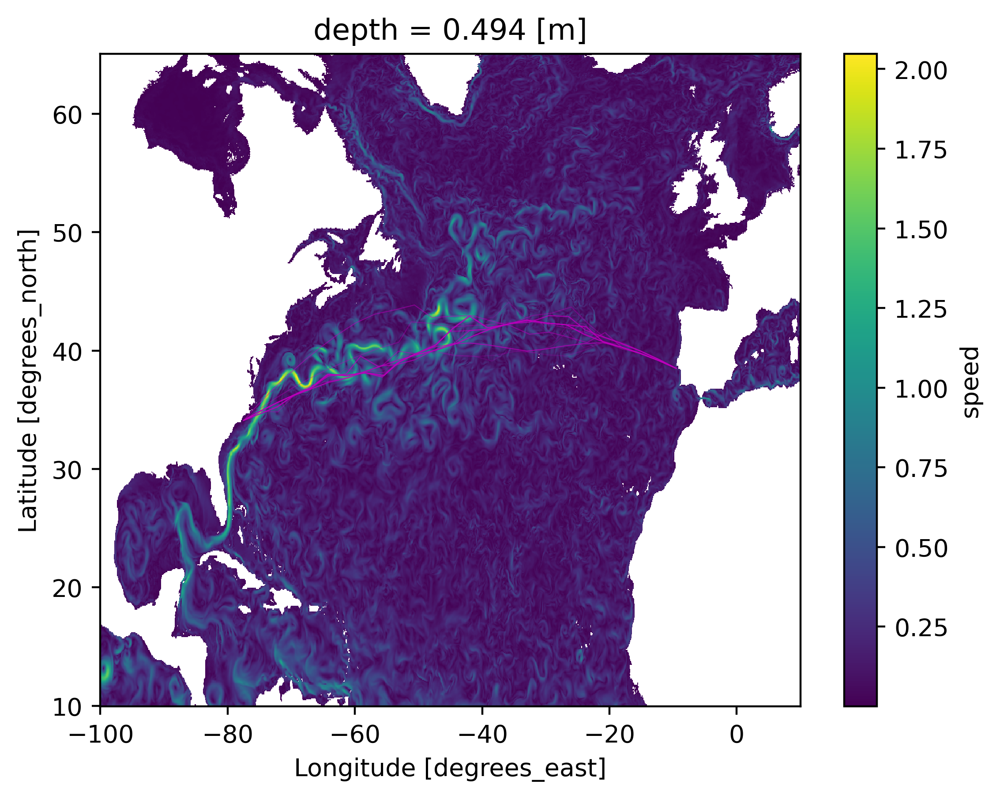

In [31]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [32]:
resolution /= 2
perturbation /= 2
population_size *= 2

In [33]:
population = dbag.from_sequence(
    [
        choice(population).refine(new_dist=resolution).homogenize().copy()
        for n in range(population_size)
    ]
)

In [34]:
for nevol in tqdm.tqdm(range(4 * num_evol_steps)):
    mutated = population.map(partial(mutation, curr=_curr, perturbation_numsteps=1))
    selected = selection(
        dbag.concat([mutated, population]), currents=_curr, keep_percent=50
    ).compute()
    population = reproduction(selected)

population = population.compute();

100%|███████████████████████████████████████████████████████████████████| 8/8 [01:03<00:00,  7.89s/it]


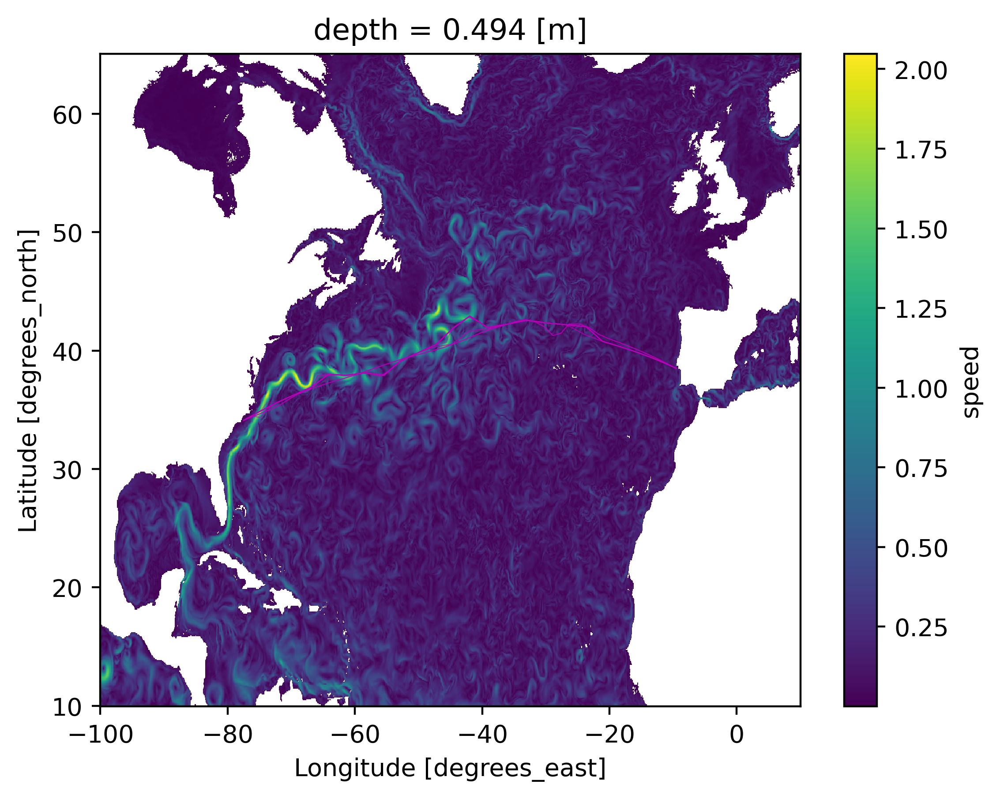

In [35]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [36]:
resolution /= 2
perturbation /= 2
population_size *= 2

In [37]:
population = dbag.from_sequence(
    [
        choice(population).refine(new_dist=resolution).homogenize().copy()
        for n in range(population_size)
    ]
)

In [38]:
for nevol in tqdm.tqdm(range(4 * num_evol_steps)):
    mutated = population.map(partial(mutation, curr=_curr, perturbation_numsteps=1))
    selected = selection(
        dbag.concat([mutated, population]), currents=_curr, keep_percent=50
    ).compute()
    population = reproduction(selected)

population = population.compute();

100%|███████████████████████████████████████████████████████████████████| 8/8 [03:05<00:00, 23.22s/it]


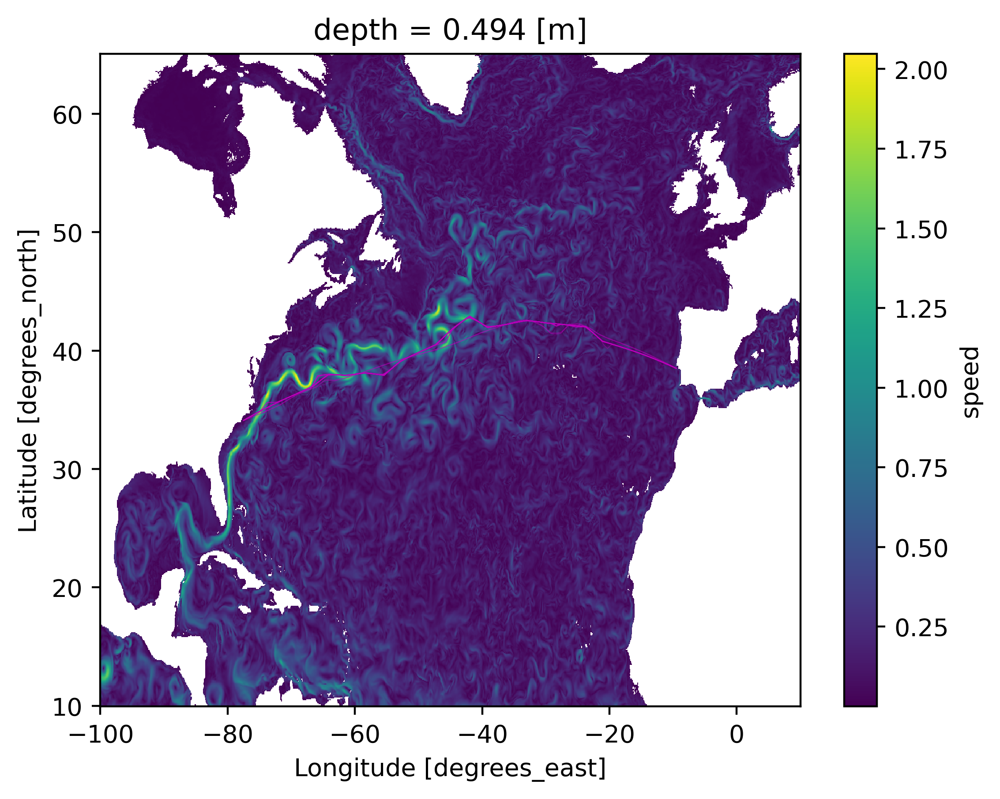

In [39]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.speed.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

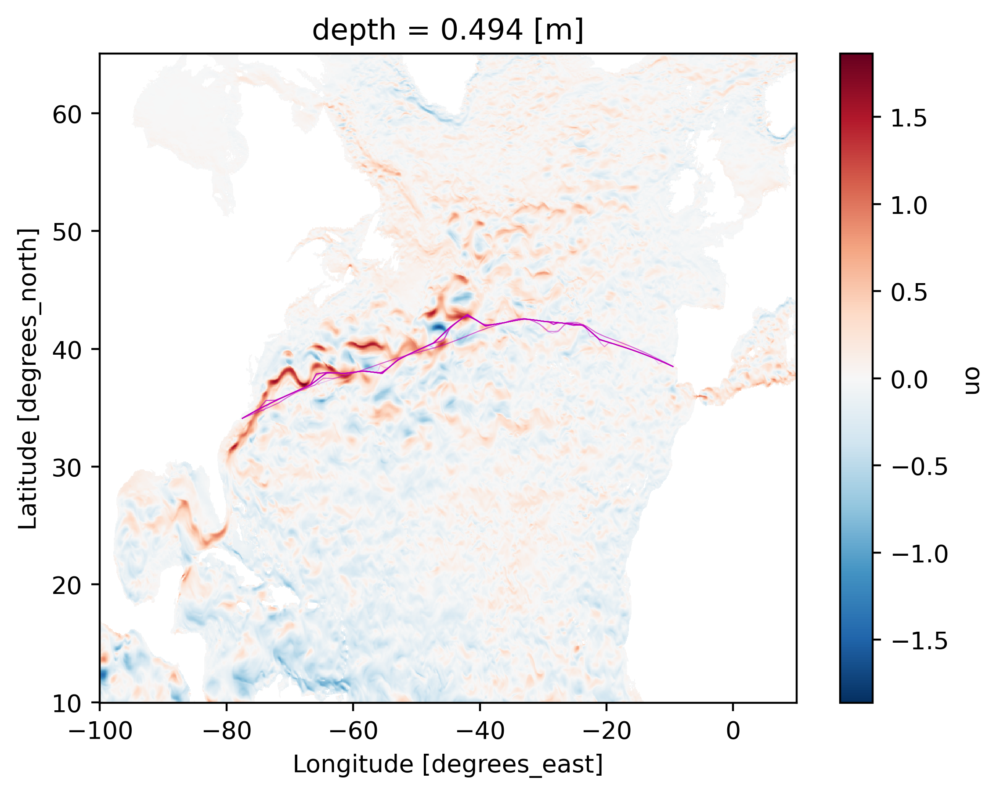

In [40]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.uo.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

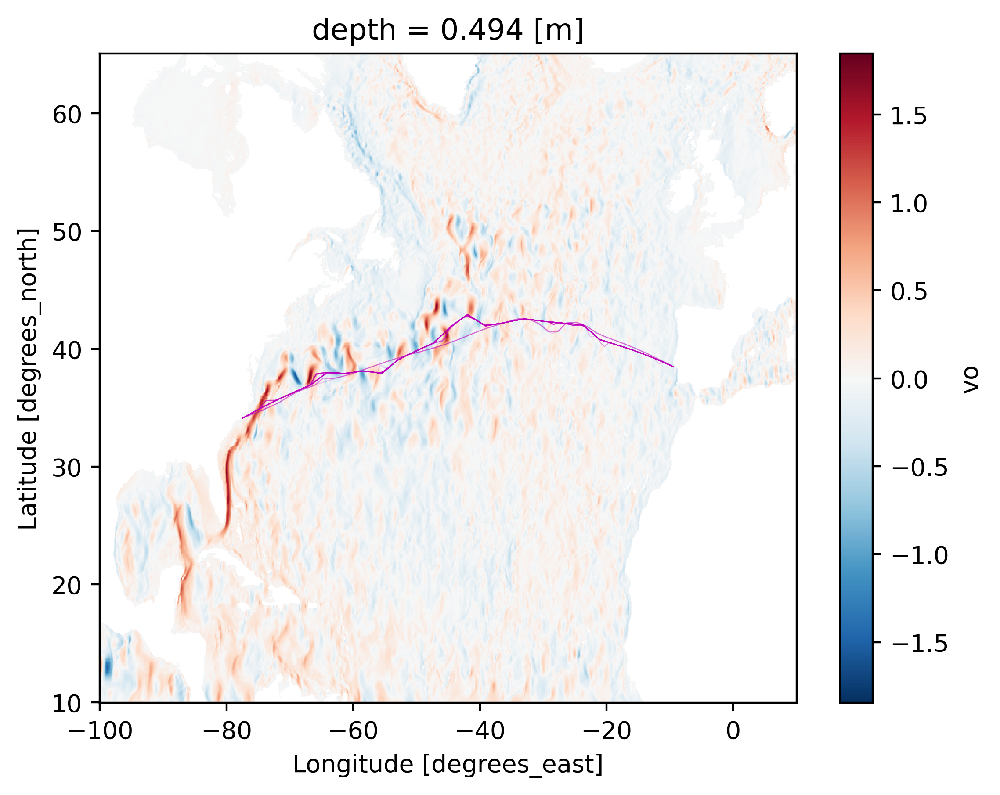

In [41]:
fig, ax = plt.subplots(1, 1)
fig.set_dpi(400)

currents.vo.plot(x="lon", y="lat", ax=ax)
for m in population:
    ax.plot(*m.line_string.xy, "m-", linewidth=0.4, alpha=0.2)

In [42]:
resolution

125000.0